In [138]:
import os
import cv2
import numpy as np
from skimage import measure
from sklearn.metrics import accuracy_score, precision_score
from scipy import ndimage
import matplotlib.pyplot as plt
from torch.utils.data import Dataset

In [139]:
image_paths = './BCCD Dataset with mask/test/original'
mask_paths = './BCCD Dataset with mask/test/mask'

In [140]:
def load_images(image_dir, mask_dir):
    images = []
    masks = []
    
    for filename in os.listdir(image_dir):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            img = cv2.imread(os.path.join(image_dir, filename))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            images.append(img)
            
            mask = cv2.imread(os.path.join(mask_dir, filename), cv2.IMREAD_GRAYSCALE)
            masks.append(mask)
    
    return images, masks

In [141]:
def hough_circle_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = cv2.medianBlur(gray, 5)
    circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, dp=1, minDist=20,
                               param1=50, param2=30, minRadius=5, maxRadius=30)
    
    hough_count = 0
    if circles is not None:
        circles = np.uint16(np.around(circles))
        hough_count = len(circles[0])
        for i in circles[0, :]:
            # draw the outer circle
            cv2.circle(image, (i[0], i[1]), i[2], (0, 255, 0), 2)
            # draw the center of the circle
            cv2.circle(image, (i[0], i[1]), 2, (0, 0, 255), 3)

    return image, hough_count

In [142]:
def watershed_segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    ret, thresh = cv2.threshold(gray, 127, 255, 0)
    
    sure_bg = cv2.dilate(thresh, np.ones((3, 3), np.uint8), iterations=3)
    
    dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    unknown = cv2.subtract(sure_bg.astype(np.uint8), sure_fg.astype(np.uint8))

    _, markers = cv2.connectedComponents(sure_fg.astype(np.uint8))
    markers = markers + 1
    markers[unknown == 255] = 0

    # Применение алгоритма водораздела
    markers = cv2.watershed(image, markers)

    # Создание цветного изображения для закрашивания областей
    colored_image = np.zeros_like(image)
    for label in np.unique(markers):
        if label == -1:  # границы
            continue
        mask = np.zeros(markers.shape, dtype="uint8")
        mask[markers == label] = 255
        color = np.random.randint(0, 255, size=(3,), dtype=int)  # случайный цвет
        colored_image[mask == 255] = color

    return colored_image, len(np.unique(markers)) - 1  # Вычисляем количество выделенных областей (без фона)

In [143]:
def evaluate_segmentation(ground_truth_mask, predicted_mask):
    true_positive = np.sum((ground_truth_mask == 255) & (predicted_mask == 255))
    false_positive = np.sum((ground_truth_mask == 0) & (predicted_mask == 255))
    false_negative = np.sum((ground_truth_mask == 255) & (predicted_mask == 0))

    accuracy = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0
    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0

    return accuracy, precision

In [144]:
def main():
    images, masks = load_images(image_paths, mask_paths)

    total_hough_cells = 0
    total_watershed_cells = 0
    accuracies_hough = []
    precisions_hough = []
    accuracies_watershed = []
    precisions_watershed = []

    num_images_to_process = min(len(images), 50)

    for i in range(num_images_to_process):
        image = images[i]
        mask = masks[i]

        # Метод Хафа
        hough_image, hough_count = hough_circle_detection(image.copy())
        total_hough_cells += hough_count
        
        # Алгоритм водораздела
        watershed_image, watershed_count = watershed_segmentation(image.copy())
        total_watershed_cells += watershed_count
        
        # Оценка качества для метода Хафа
        acc_hough, prec_hough = evaluate_segmentation(mask, hough_image[..., 0])  # Используем один канал для оценки

        # Оценка качества для алгоритма водораздела
        acc_watershed, prec_watershed = evaluate_segmentation(mask, watershed_image[..., 0])  # Используем один канал для оценки

        accuracies_hough.append(acc_hough)
        precisions_hough.append(prec_hough)
        accuracies_watershed.append(acc_watershed)
        precisions_watershed.append(prec_watershed)

        print(f"Изображение {i + 1}:")
        print(f"Маска: {os.listdir(mask_paths)[i]}")
        print(f"Количество клеток методом Хафа: {hough_count}")
        print(f"Количество клеток алгоритм водораздела: {watershed_count}")
        print(f"Показатели качества (Метод Хафа): Accuracy = {acc_hough:.2f}, Precision = {prec_hough:.2f}")
        print(f"Показатели качества (Алгоритм водораздела): Accuracy = {acc_watershed:.2f}, Precision = {prec_watershed:.2f}")
        
        plt.figure(figsize=(10, 5))
        
        plt.subplot(1, 2, 1)
        plt.imshow(hough_image)
        plt.title(f"Метод Хафа - Изображение {i + 1}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(watershed_image)
        plt.title(f"Алгоритм Водораздела - Изображение {i + 1}")
        plt.axis('off')
        
        plt.show()

        # Усреднение метрик
    avg_accuracy_hough = np.mean(accuracies_hough)
    avg_precision_hough = np.mean(precisions_hough)
    avg_accuracy_watershed = np.mean(accuracies_watershed)
    avg_precision_watershed = np.mean(precisions_watershed)

    print("\nИтоговые результаты:")
    print(f"Метод Хафа: Средняя accuracy = {avg_accuracy_hough:.2f}, Средняя precision = {avg_precision_hough:.2f}")
    print(f"Алгоритм водораздела: Средняя accuracy = {avg_accuracy_watershed:.2f}, Средняя precision = {avg_precision_watershed:.2f}")
    print(f"Общее количество клеток (метод Хафа): {total_hough_cells}")
    print(f"Общее количество клеток (алгоритм водораздела): {total_watershed_cells}")

Изображение 1:
Маска: e02301ac-68f7-4daf-b2ba-254b917f1cca.png
Количество клеток методом Хафа: 0
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


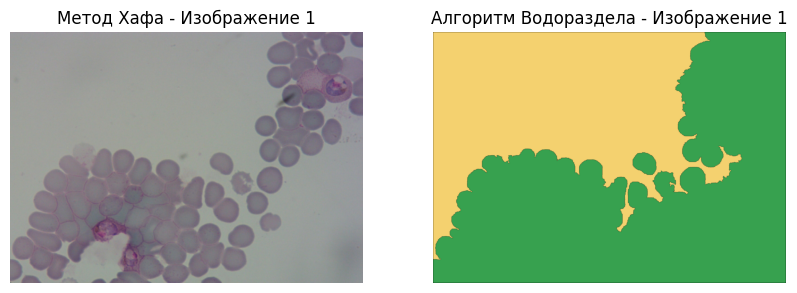

Изображение 2:
Маска: e11515b4-9527-4c23-a0ba-43719bacca0d.png
Количество клеток методом Хафа: 3
Количество клеток алгоритм водораздела: 4
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


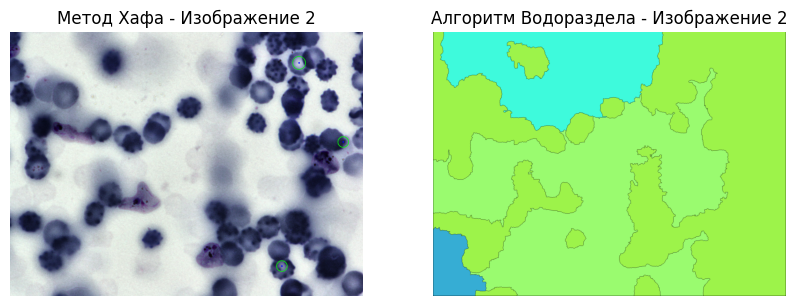

Изображение 3:
Маска: e13f2327-fbf4-4d84-a8c1-09cb1e449c8c.png
Количество клеток методом Хафа: 13
Количество клеток алгоритм водораздела: 6
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


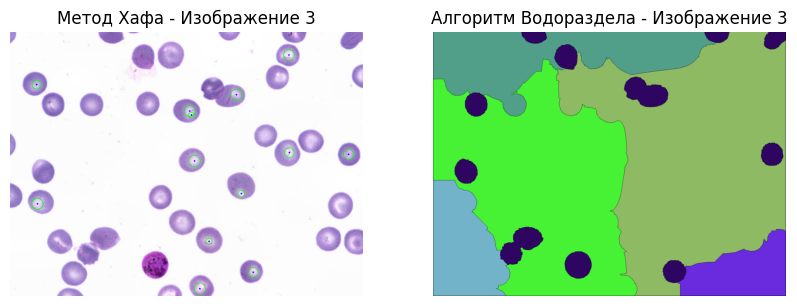

Изображение 4:
Маска: e16c0dab-780d-4035-872e-1bb91e49f9d2.png
Количество клеток методом Хафа: 15
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


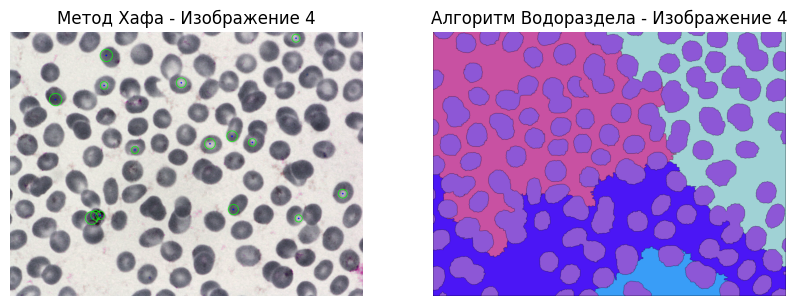

Изображение 5:
Маска: e1937e32-85d5-4cd8-bb4a-b9cf8ee7ceeb.png
Количество клеток методом Хафа: 3
Количество клеток алгоритм водораздела: 4
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


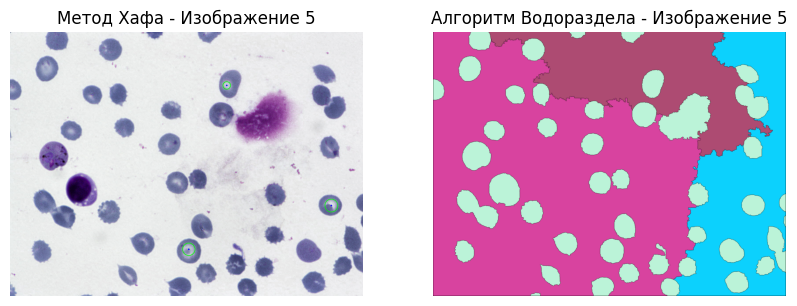

Изображение 6:
Маска: e234ce8b-4ec4-4d93-9068-d7854d77ddf4.png
Количество клеток методом Хафа: 10
Количество клеток алгоритм водораздела: 4
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


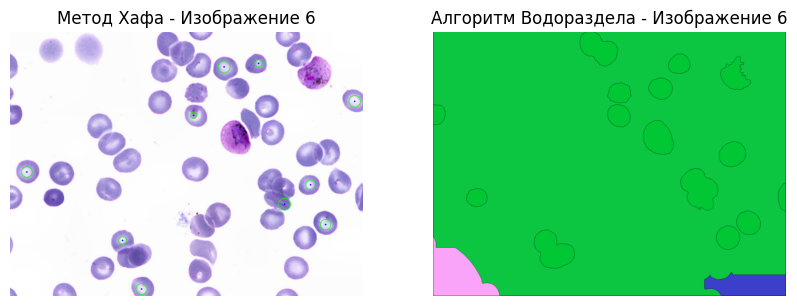

Изображение 7:
Маска: e26b88c6-5884-4b5c-94d7-ad780379c8ad.png
Количество клеток методом Хафа: 2
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


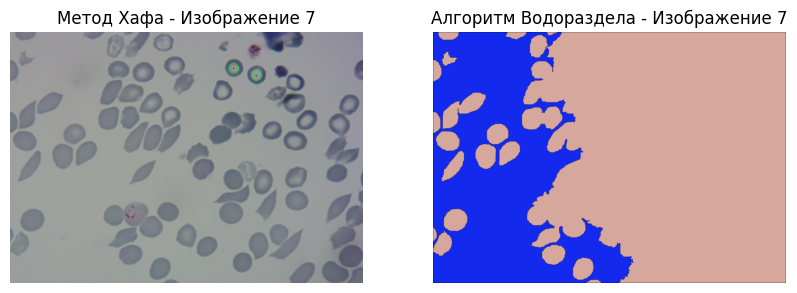

Изображение 8:
Маска: e36cb882-c6d0-4467-812e-d18c169a9a47.png
Количество клеток методом Хафа: 5
Количество клеток алгоритм водораздела: 8
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


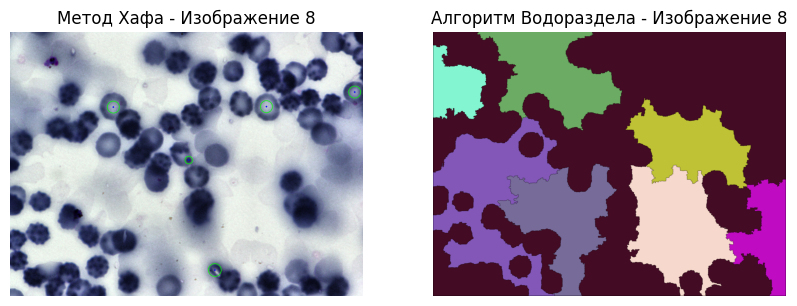

Изображение 9:
Маска: e3ade58d-086c-47fa-9120-76beacb45395.png
Количество клеток методом Хафа: 54
Количество клеток алгоритм водораздела: 3
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


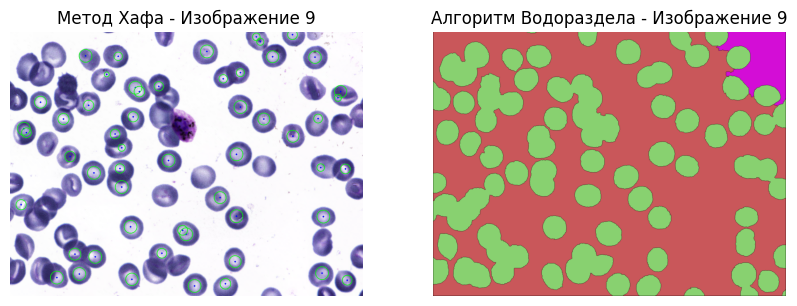

Изображение 10:
Маска: e3c1442a-717f-41dd-bf97-81e1233ac9fa.png
Количество клеток методом Хафа: 8
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


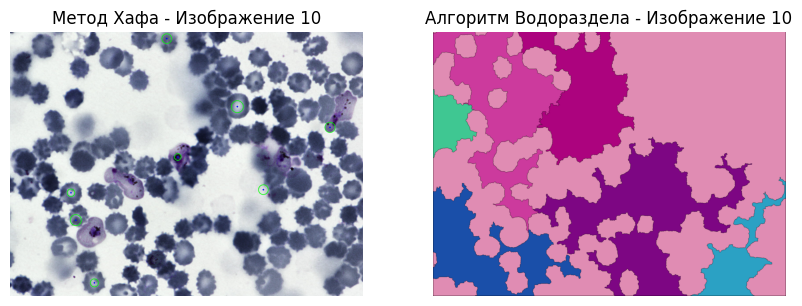

Изображение 11:
Маска: e3e9c2de-0a24-4c7e-8a69-3d3093d5bdab.png
Количество клеток методом Хафа: 56
Количество клеток алгоритм водораздела: 14
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


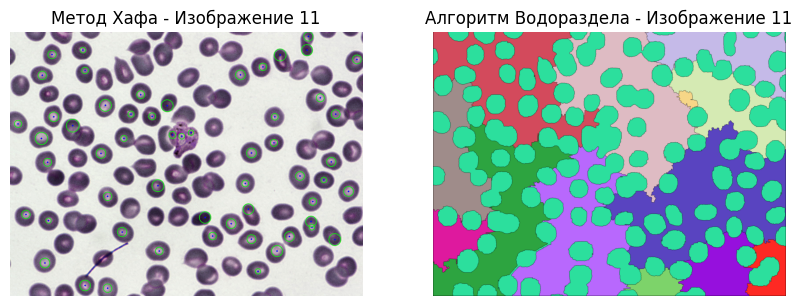

Изображение 12:
Маска: e3ea07d7-884a-412e-874a-40fd6b856736.png
Количество клеток методом Хафа: 2
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


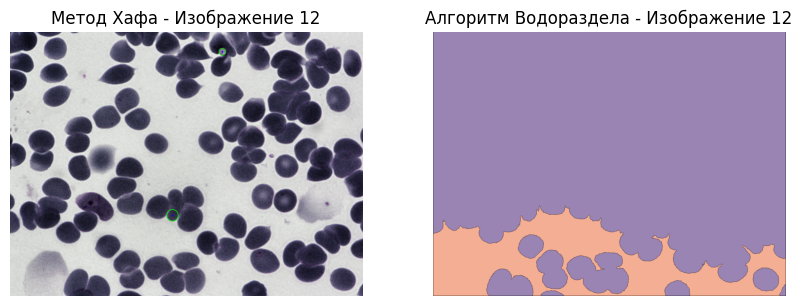

Изображение 13:
Маска: e40000b4-1b26-42ce-909d-4715e04f0a6e.png
Количество клеток методом Хафа: 50
Количество клеток алгоритм водораздела: 4
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


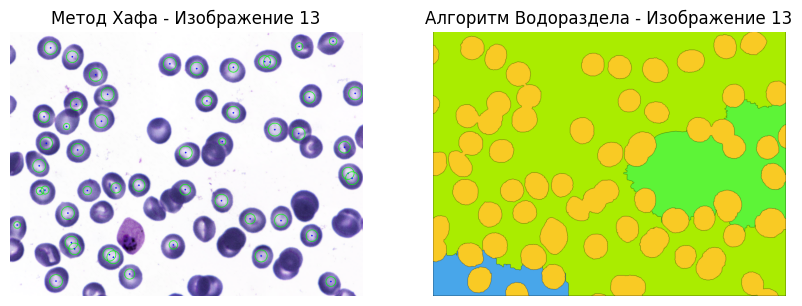

Изображение 14:
Маска: e474a20b-2769-48f1-a520-4f6ef5a0dbf5.png
Количество клеток методом Хафа: 79
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


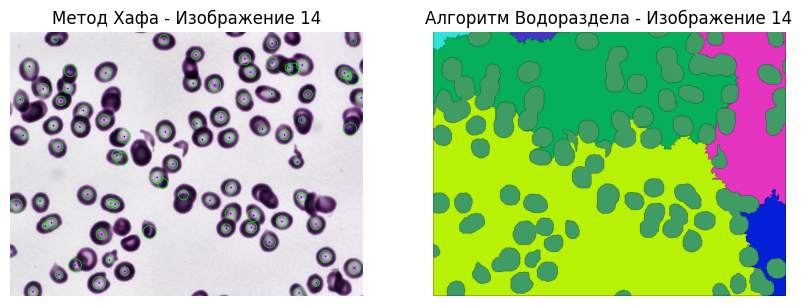

Изображение 15:
Маска: e4827c85-311a-4df1-89c2-99dad0c3558c.png
Количество клеток методом Хафа: 26
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


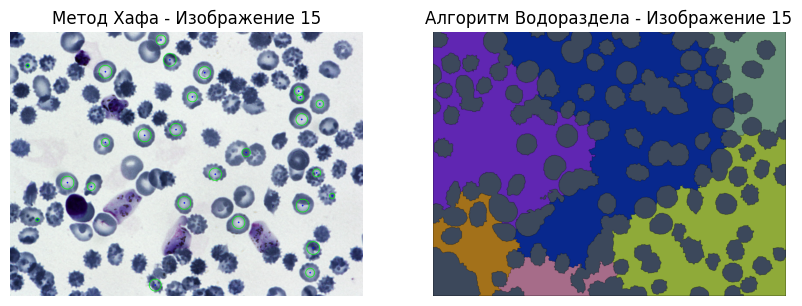

Изображение 16:
Маска: e4eea7ea-8989-46a9-9c98-25a178146b28.png
Количество клеток методом Хафа: 121
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


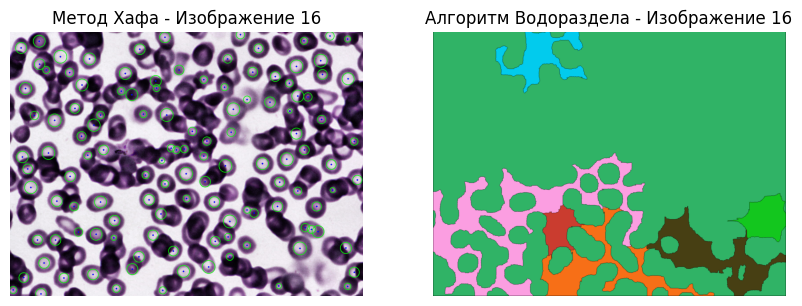

Изображение 17:
Маска: e5731221-814c-4894-a44e-e46b71460fa4.png
Количество клеток методом Хафа: 9
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


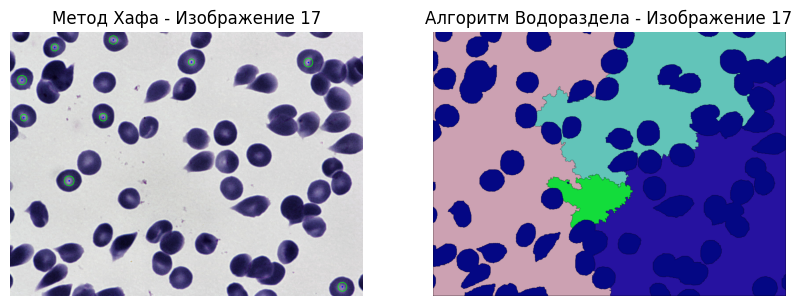

Изображение 18:
Маска: e597f7ce-46c6-4dce-9063-50a2703fdd45.png
Количество клеток методом Хафа: 1
Количество клеток алгоритм водораздела: 11
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


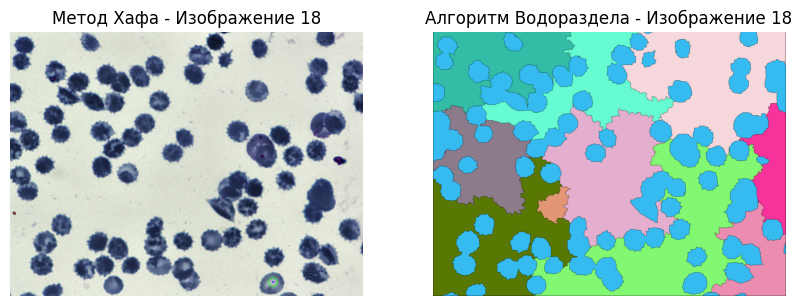

Изображение 19:
Маска: e5fd5949-4cd0-4cb6-837a-02c26a5eb87a.png
Количество клеток методом Хафа: 10
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


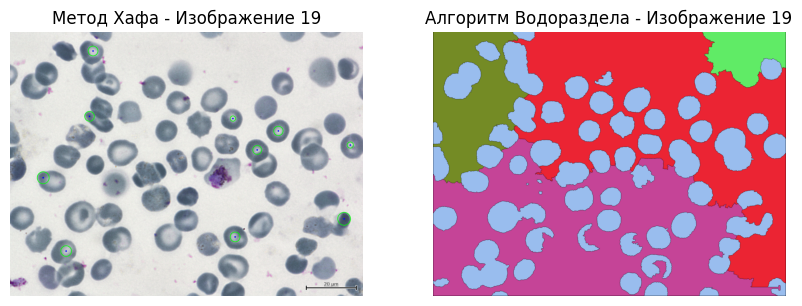

Изображение 20:
Маска: e61e6af2-7f8b-47b0-bbe7-acb2ed0299ab.png
Количество клеток методом Хафа: 9
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


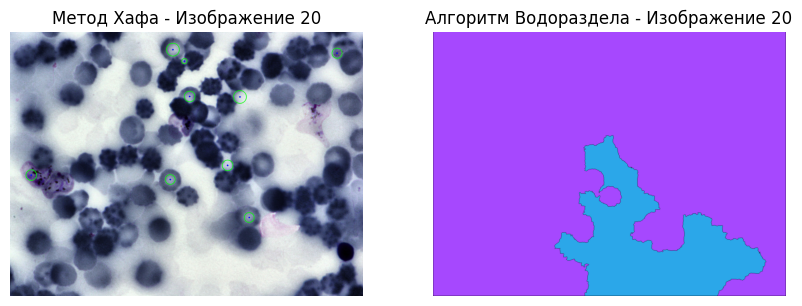

Изображение 21:
Маска: e63e1607-f344-43d6-a0d8-e10cf2e5054a.png
Количество клеток методом Хафа: 16
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.03, Precision = 0.21
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


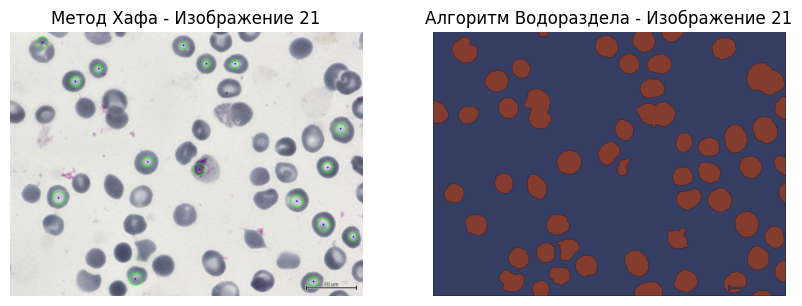

Изображение 22:
Маска: e640ae51-cbf1-4a84-b7cf-d38b17f59c2f.png
Количество клеток методом Хафа: 9
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


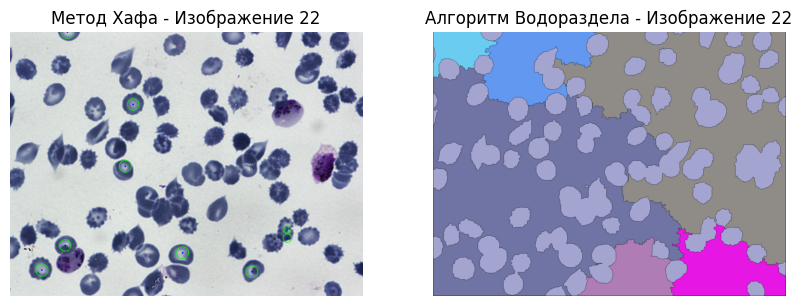

Изображение 23:
Маска: e683144c-0465-43a2-86b1-3cf52599d5e0.png
Количество клеток методом Хафа: 9
Количество клеток алгоритм водораздела: 6
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 1.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


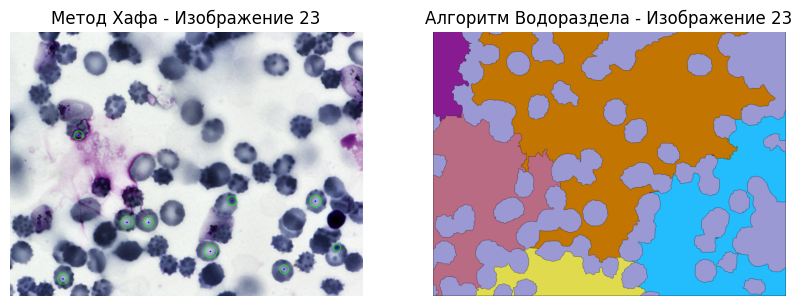

Изображение 24:
Маска: e6a7743e-4040-40fa-b097-ca6874c469b7.png
Количество клеток методом Хафа: 0
Количество клеток алгоритм водораздела: 3
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


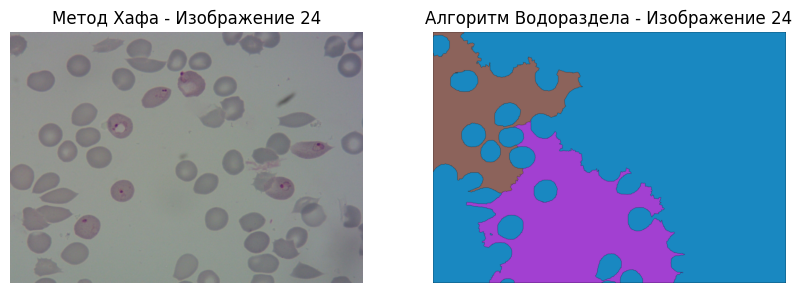

Изображение 25:
Маска: e6d7c5e1-43fc-4712-86d5-aa70252b978f.png
Количество клеток методом Хафа: 18
Количество клеток алгоритм водораздела: 4
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


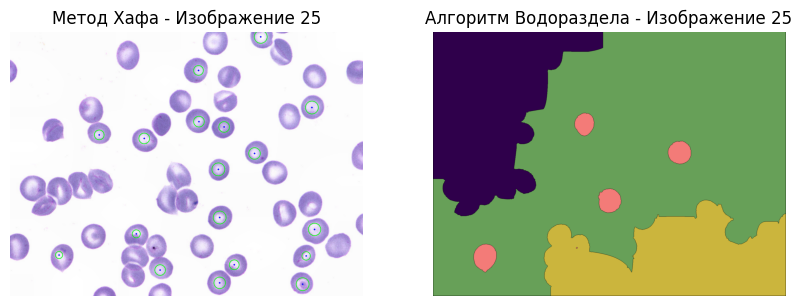

Изображение 26:
Маска: e726dac6-f962-449c-acff-4dd56847b685.png
Количество клеток методом Хафа: 10
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


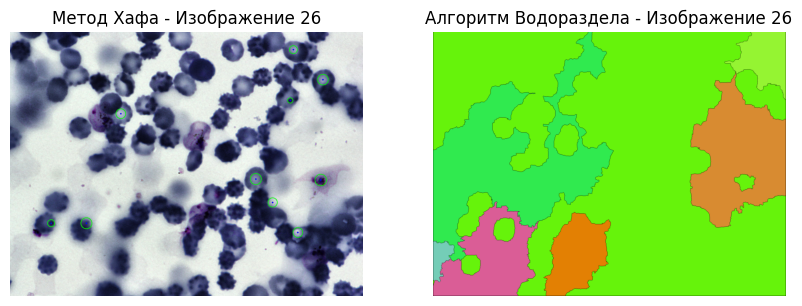

Изображение 27:
Маска: e79bd81b-f878-4bee-9be2-d91a722c031e.png
Количество клеток методом Хафа: 4
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


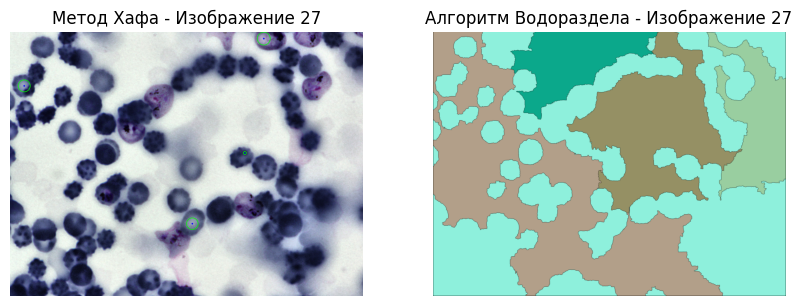

Изображение 28:
Маска: e8058bed-c362-4e1c-85dc-62f80f32938f.png
Количество клеток методом Хафа: 6
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


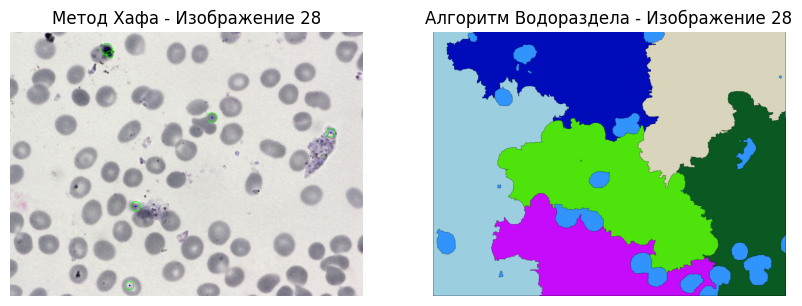

Изображение 29:
Маска: e80bad38-66d0-473e-85dd-92142dba37e6.png
Количество клеток методом Хафа: 3
Количество клеток алгоритм водораздела: 4
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


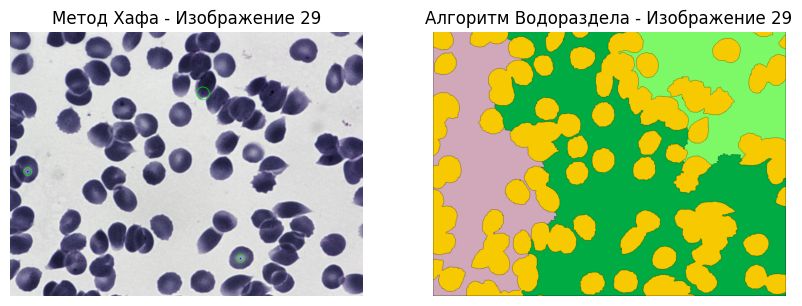

Изображение 30:
Маска: e81bf478-27ff-458c-ac30-9e1f8480bc5c.png
Количество клеток методом Хафа: 6
Количество клеток алгоритм водораздела: 10
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


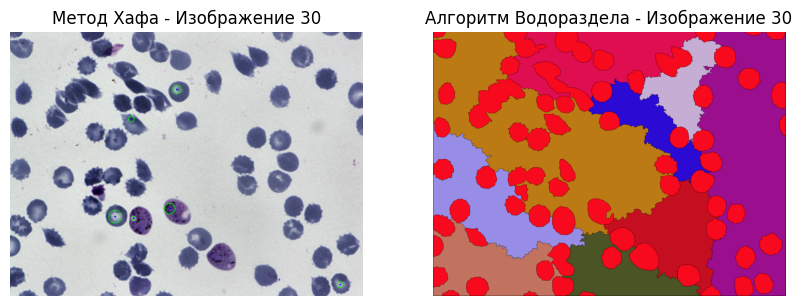

Изображение 31:
Маска: e871f52c-77a6-4813-80d4-95bd97985f1a.png
Количество клеток методом Хафа: 42
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


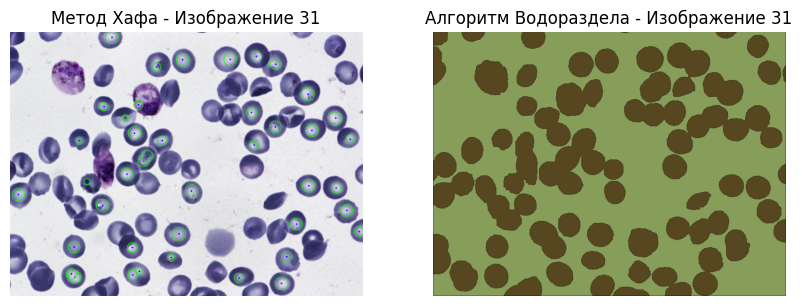

Изображение 32:
Маска: e93e617e-ed36-43d9-bd1a-4ffd2fba64e9.png
Количество клеток методом Хафа: 0
Количество клеток алгоритм водораздела: 3
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


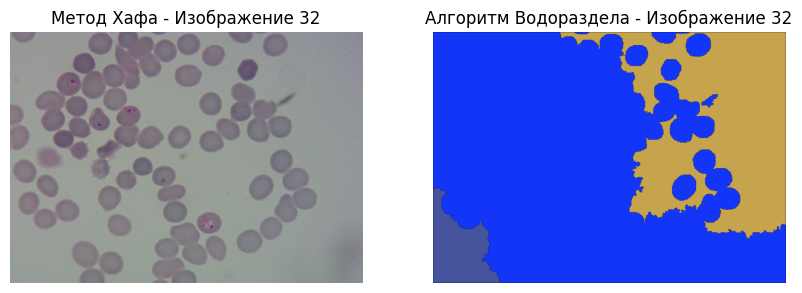

Изображение 33:
Маска: e94a811d-3145-4313-ba42-2d5ed283179f.png
Количество клеток методом Хафа: 41
Количество клеток алгоритм водораздела: 18
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


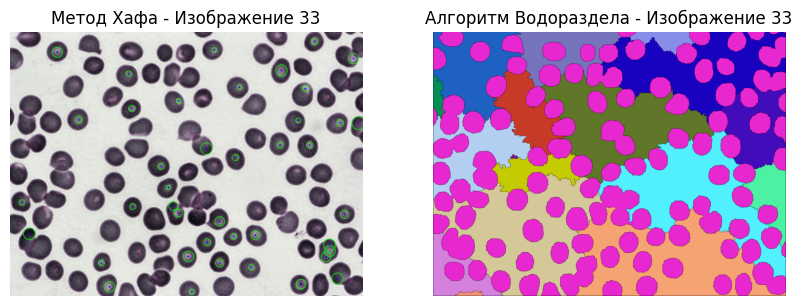

Изображение 34:
Маска: e98baeb2-aa58-4cce-8c61-66685dd2b239.png
Количество клеток методом Хафа: 3
Количество клеток алгоритм водораздела: 9
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


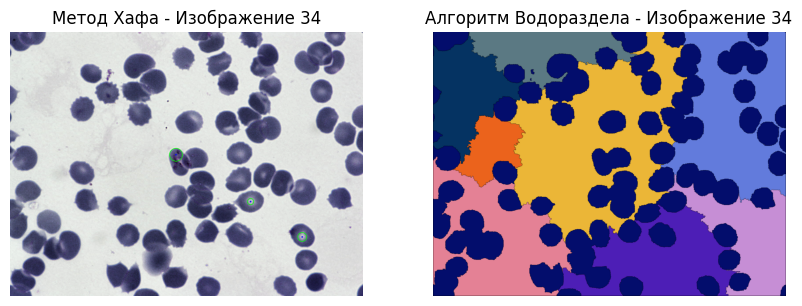

Изображение 35:
Маска: e98ea067-82b5-4a0d-87bf-b4bbdc10ddab.png
Количество клеток методом Хафа: 18
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


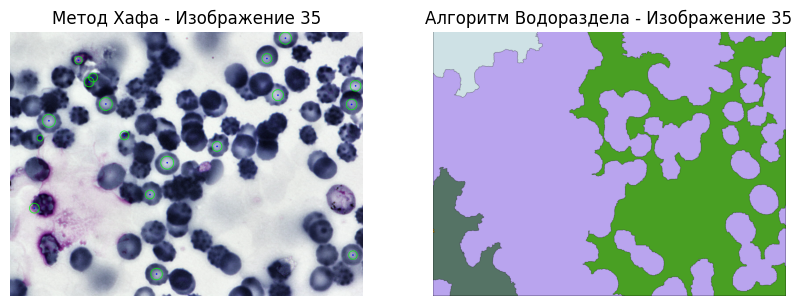

Изображение 36:
Маска: e9916e11-9be6-4dec-9df6-2e7d1a8e1735.png
Количество клеток методом Хафа: 2
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


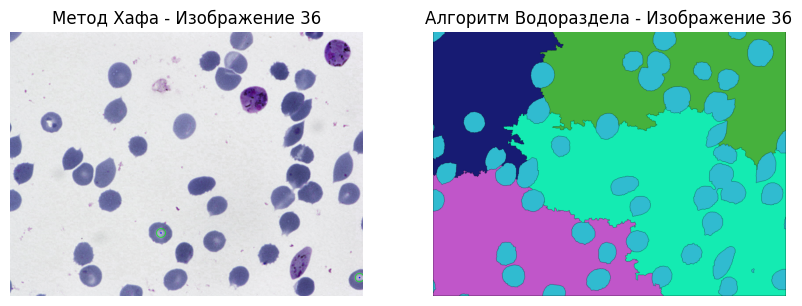

Изображение 37:
Маска: e9e78ff8-831b-46e9-9785-3eee9acbfcd8.png
Количество клеток методом Хафа: 95
Количество клеток алгоритм водораздела: 11
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


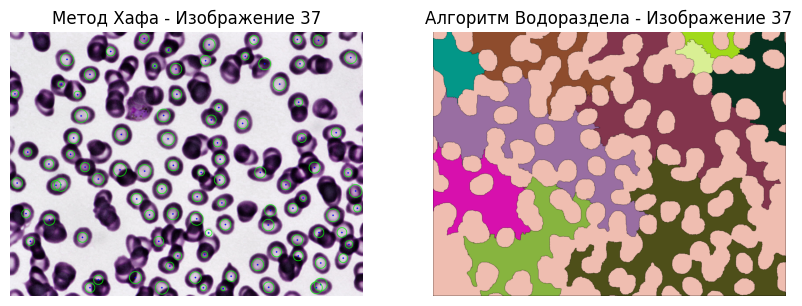

Изображение 38:
Маска: ea6b012a-3425-4bfc-a61d-88563aa2a264.png
Количество клеток методом Хафа: 0
Количество клеток алгоритм водораздела: 3
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


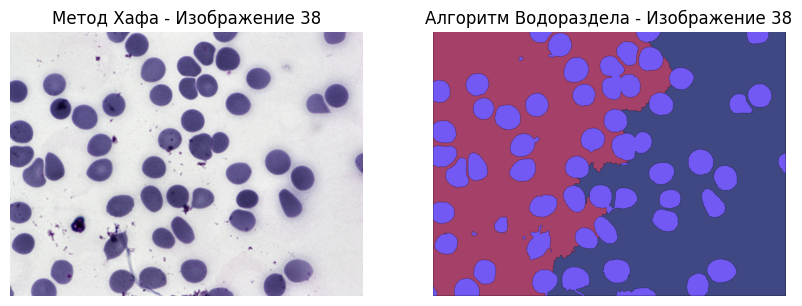

Изображение 39:
Маска: eaf4b781-b3aa-41ce-8c5e-287979b4e15a.png
Количество клеток методом Хафа: 89
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


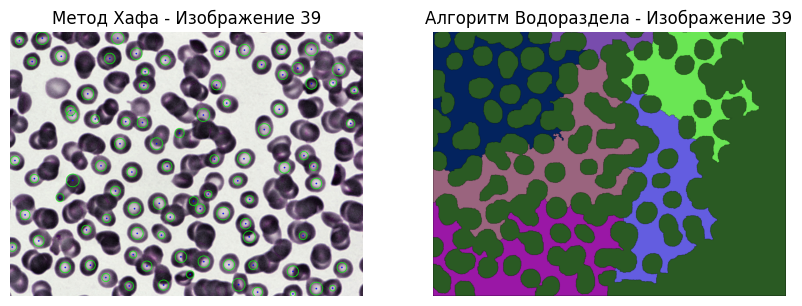

Изображение 40:
Маска: eb0173a3-7e5e-4f53-8124-03d9d6317844.png
Количество клеток методом Хафа: 18
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


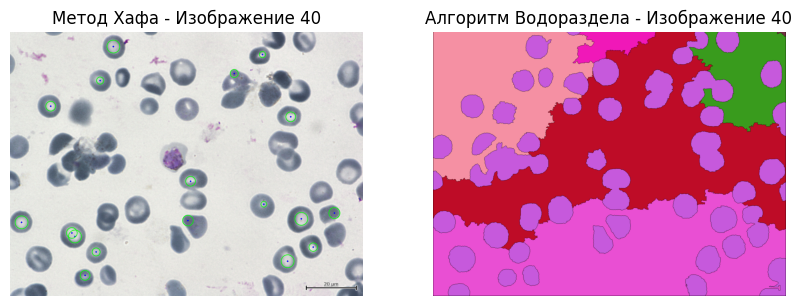

Изображение 41:
Маска: eb5f4f2f-2275-4a80-84a5-78a1eaf4ce4d.png
Количество клеток методом Хафа: 20
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.02, Precision = 0.22
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


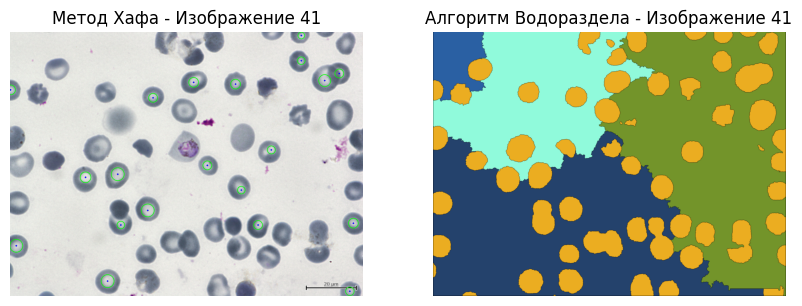

Изображение 42:
Маска: eb6e8684-b84e-483d-b835-f59286d2516b.png
Количество клеток методом Хафа: 5
Количество клеток алгоритм водораздела: 4
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


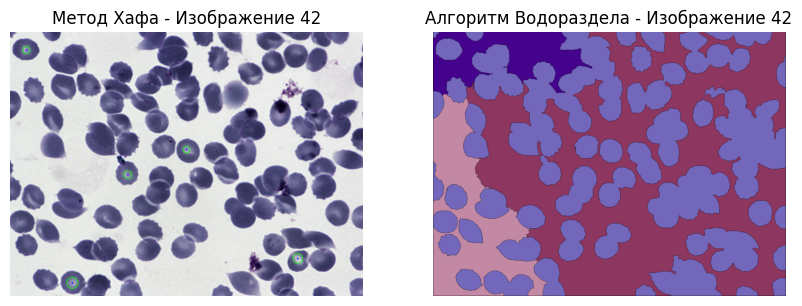

Изображение 43:
Маска: eb77e4a9-acb0-4d83-8055-2c5fcaa54b45.png
Количество клеток методом Хафа: 118
Количество клеток алгоритм водораздела: 13
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


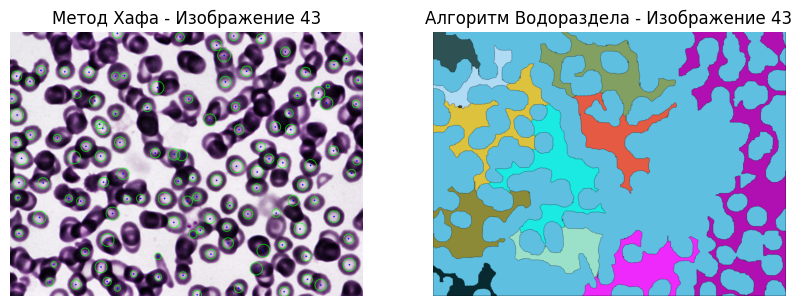

Изображение 44:
Маска: eb86033f-4f1c-4e8c-ae84-e8e4c7e08626.png
Количество клеток методом Хафа: 13
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


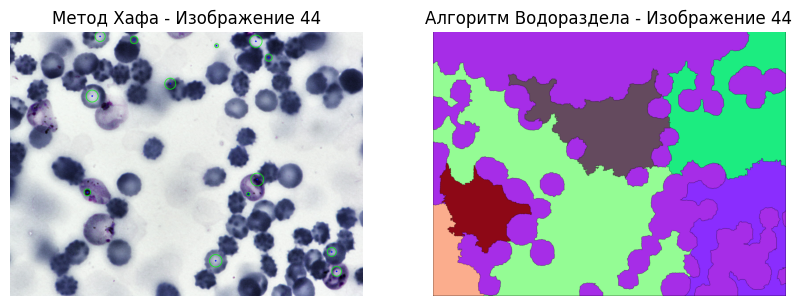

Изображение 45:
Маска: eba73bff-fbe1-436d-9a5f-0a61331a0ea2.png
Количество клеток методом Хафа: 17
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


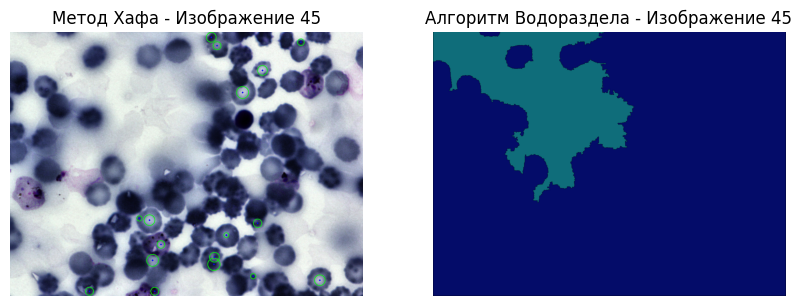

Изображение 46:
Маска: ebb53337-1d4f-4ab5-9b6d-83a66f48fe2e.png
Количество клеток методом Хафа: 0
Количество клеток алгоритм водораздела: 5
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


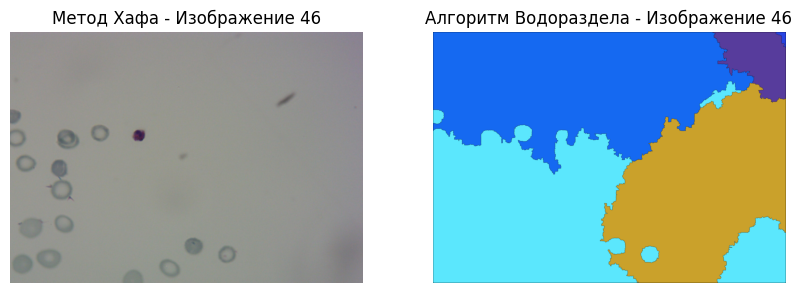

Изображение 47:
Маска: ebc4056e-d766-43cf-b6b4-5dac79d96e84.png
Количество клеток методом Хафа: 0
Количество клеток алгоритм водораздела: 2
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


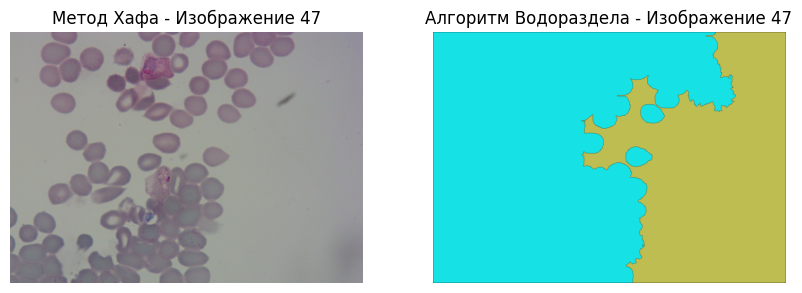

Изображение 48:
Маска: ebfd9f67-138e-49f0-9cef-a0352069eedb.png
Количество клеток методом Хафа: 8
Количество клеток алгоритм водораздела: 17
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


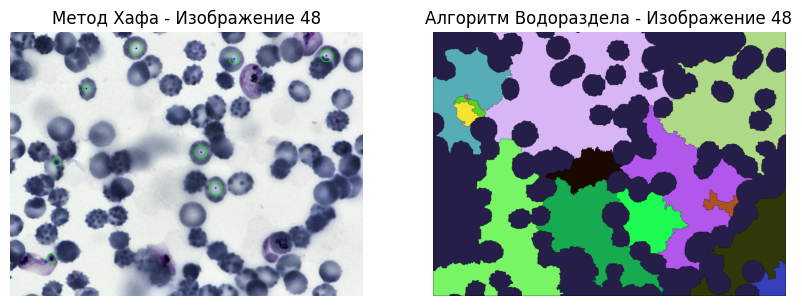

Изображение 49:
Маска: ec301f62-1302-4407-96f9-fcfe45c150ae.png
Количество клеток методом Хафа: 27
Количество клеток алгоритм водораздела: 7
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


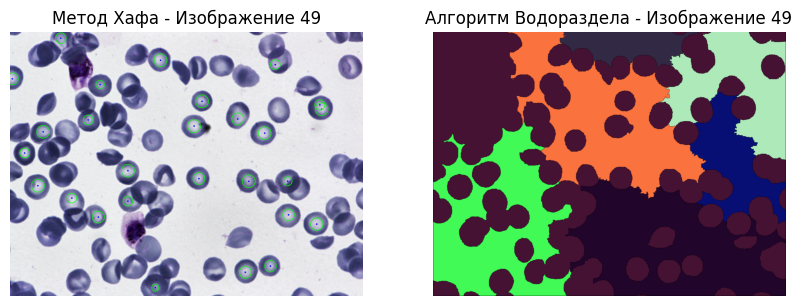

Изображение 50:
Маска: ec60ab26-3343-4c5f-9667-cdae999c7d86.png
Количество клеток методом Хафа: 0
Количество клеток алгоритм водораздела: 9
Показатели качества (Метод Хафа): Accuracy = 0.00, Precision = 0.00
Показатели качества (Алгоритм водораздела): Accuracy = 0.00, Precision = 0.00


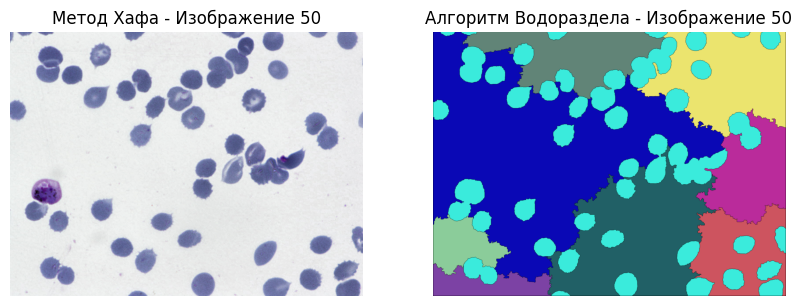


Итоговые результаты:
Метод Хафа: Средняя accuracy = 0.00, Средняя precision = 0.03
Алгоритм водораздела: Средняя accuracy = 0.00, Средняя precision = 0.00
Общее количество клеток (метод Хафа): 1073
Общее количество клеток (алгоритм водораздела): 305


In [145]:
if __name__ == "__main__":
    main()